# load dataset

In [2]:
import pandas as pd
import re
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords

In [3]:
data1 = pd.read_csv('mail_data.csv', encoding='latin-1')
data2 = pd.read_csv('Phishing_Email.csv', encoding='utf-8', on_bad_lines='skip', engine='python')


In [4]:
data1

,Category,Message
0,ham,"Go until jurong point, crazy.. Available only ..."
1,ham,Ok lar... Joking wif u oni...
2,spam,Free entry in 2 a wkly comp to win FA Cup fina...
3,ham,U dun say so early hor... U c already then say...
4,ham,"Nah I don't think he goes to usf, he lives aro..."
...,...,...
5567,spam,This is the 2nd time we have tried 2 contact u...
5568,ham,Will Ã¼ b going to esplanade fr home?
5569,ham,"Pity, * was in mood for that. So...any other s..."
5570,ham,The guy did some bitching but I acted like i'd...


In [5]:
data1.duplicated().sum()
data1.drop_duplicates(inplace=True)
data1.duplicated().sum()

np.int64(0)

In [6]:
data2.duplicated().sum()
data2.drop_duplicates(inplace=True)
data2.duplicated().sum()

np.int64(0)

In [7]:
data2.drop(['Unnamed: 0'], axis =1)

,Email Text,Email Type
0,"re : 6 . 1100 , disc : uniformitarianism , re ...",Safe Email
1,the other side of * galicismos * * galicismo *...,Safe Email
2,re : equistar deal tickets are you still avail...,Safe Email
3,\nHello I am your hot lil horny toy.\n I am...,Phishing Email
4,software at incredibly low prices ( 86 % lower...,Phishing Email
...,...,...
20693,date a lonely housewife always wanted to date ...,Phishing Email
20694,request submitted : access request for anita ....,Safe Email
20695,"re : important - prc mtg hi dorn & john , as y...",Safe Email
20696,press clippings - letter on californian utilit...,Safe Email


# pre-processing

In [8]:
import re

def preprocessing(msg):
    if not isinstance(msg, str):
        msg = str(msg)
    msg = lower_text(msg)
    msg = remove_special_characters(msg)
    msg = remove_numbers(msg)
    msg = remove_extra_spaces(msg)
    msg = remove_short_text(msg)
    msg = remove_emojis(msg)
    return msg

def lower_text(text):
    text = text.lower()
    return text

def remove_special_characters(text):
    text = re.sub(r'[^a-zA-Z\s]', '', text)
    return text

def remove_numbers(text):
    text = re.sub(r'\d+', '', text)
    return text

def remove_extra_spaces(text):
    text = re.sub(r'\s+', ' ', text).strip()
    return text

def remove_short_text(text, min_length=10):
    return text if len(text) >= min_length else ''

def remove_emojis(text):
    emoji_pattern = re.compile("[\U00010000-\U0010ffff]", flags=re.UNICODE)
    return emoji_pattern.sub(r'', text)

data1['Message'] = data1['Message'].apply(preprocessing)
data1 = data1[data1['Message'] != '']

data2['Email Text'] = data2['Email Text'].apply(preprocessing)
data2 = data2[data2['Email Text'] != '']


In [9]:
data1['Spam'] = data1['Category'].map({'spam': 1, 'ham': 0})
data1.drop(['Category'],axis = 1)

C:\Users\ASUS\AppData\Local\Temp\ipykernel_8376\1756508818.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data1['Spam'] = data1['Category'].map({'spam': 1, 'ham': 0})


,Message,Spam
0,go until jurong point crazy available only in ...,0
1,ok lar joking wif u oni,0
2,free entry in a wkly comp to win fa cup final ...,1
3,u dun say so early hor u c already then say,0
4,nah i dont think he goes to usf he lives aroun...,0
...,...,...
5567,this is the nd time we have tried contact u u ...,1
5568,will b going to esplanade fr home,0
5569,pity was in mood for that soany other suggestions,0
5570,the guy did some bitching but i acted like id ...,0


In [10]:
data2['Phishing'] = data2['Email Type'].map({'Phishing Email': 1, 'Safe Email': 0}).fillna(-1)
data2 = data2[['Email Text', 'Phishing']]
data2

,Email Text,Phishing
0,re disc uniformitarianism re sex lang dick hud...,0.0
1,the other side of galicismos galicismo is a sp...,0.0
2,re equistar deal tickets are you still availab...,0.0
3,hello i am your hot lil horny toy i am the one...,1.0
4,software at incredibly low prices lower draper...,1.0
...,...,...
20692,rick moen a crit im confused i thought it was ...,0.0
20693,date a lonely housewife always wanted to date ...,1.0
20694,request submitted access request for anita dup...,0.0
20695,re important prc mtg hi dorn john as you disco...,0.0


stopword

In [11]:
import nltk
nltk.download('stopwords')
nltk.download('wordnet')



[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ASUS\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\ASUS\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [12]:
import re
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words('english'))

slang_dict = {
    "u": "you",
    "ur": "your",
    "r": "are",
    "2": "to",
    "4": "for",
    "pls": "please",
    "plz": "please",
    "wif": "with",
    "dun": "don't",
    "wat": "what",
    "lar": "lah",
    "oni": "only",
    "tkts": "tickets",
    "n": "and",
    "c": "see",
    "b4": "before",
    "msg": "message",
    "txt": "text",
    "wkly": "weekly",
    "comp": "competition",
    "fa": "football association",
    "lil" : "little",
    "disc": "discount",

}


def process2_text(text, slang_dict):
    def replace_slang(text, slang_dict):
        words = text.split()
        replaced = [slang_dict.get(word, word) for word in words]  # Ganti slang jika ada di kamus
        return ' '.join(replaced)

    def remove_stopwords(text):
        words = text.split()
        filtered = [word for word in words if word not in stop_words]  # Hapus stopwords
        return ' '.join(filtered)

    def lemmatize_text(text):
        words = text.split()
        lemmatized = [lemmatizer.lemmatize(word) for word in words]  # Lemmatizing
        return ' '.join(lemmatized)

    # Pipeline pembersihan teks
    text = lower_text(text)
    text = replace_slang(text, slang_dict)
    text = remove_stopwords(text)
    text = lemmatize_text(text)
    return text

data1['Message'] = data1['Message'].apply(lambda x: process2_text(str(x), slang_dict))

data2['Message'] = data2['Email Text'].apply(lambda x: process2_text(str(x), slang_dict))
# data2[['Message']].head()
data1[['Message']].head()


C:\Users\ASUS\AppData\Local\Temp\ipykernel_8376\1992193306.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data1['Message'] = data1['Message'].apply(lambda x: process2_text(str(x), slang_dict))


,Message
0,go jurong point crazy available bugis great wo...
1,ok lah joking
2,free entry weekly competition win football ass...
3,say early hor see already say
4,nah dont think go usf life around though


In [13]:
data2 = data2[['Message', 'Phishing']]
data2

,Message,Phishing
0,discount uniformitarianism sex lang dick hudso...,0.0
1,side galicismos galicismo spanish term name im...,0.0
2,equistar deal ticket still available assist ro...,0.0
3,hello hot little horny toy one dream open mind...,1.0
4,software incredibly low price lower drapery se...,1.0
...,...,...
20692,rick moen crit im confused thought gpled money...,0.0
20693,date lonely housewife always wanted date lonel...,1.0
20694,request submitted access request anita dupont ...,0.0
20695,important prc mtg hi dorn john discovered rece...,0.0


In [14]:
data1 = data1[['Message', 'Spam']]
data1

,Message,Spam
0,go jurong point crazy available bugis great wo...,0
1,ok lah joking,0
2,free entry weekly competition win football ass...,1
3,say early hor see already say,0
4,nah dont think go usf life around though,0
...,...,...
5567,nd time tried contact pound prize claim easy c...,1
5568,b going esplanade fr home,0
5569,pity mood soany suggestion,0
5570,guy bitching acted like id interested buying s...,0


In [15]:
d1 = data1
d1.to_csv('Spam after preprocessing.csv', index=False)

In [16]:
d2 = data2
d2.to_csv('Phising after prprocesiing.csv', index=False)

# EDA spam

In [17]:
spam_messages = d1[d1['Spam'] == 1]['Message']
ham_messages = d1[d1['Spam'] == 0]['Message']
print("Jumlah pesan spam:", len(spam_messages))
print("Jumlah pesan ham:", len(ham_messages))

Jumlah pesan spam: 639
Jumlah pesan ham: 4471


train test split (lewati)

In [18]:
!pip install imbalanced-learn==0.11.0


[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


# modeling using BoW

membuat kosa kata

In [19]:
d1['Spam'].value_counts()

Spam
0    4471
1     639
Name: count, dtype: int64

In [20]:
import pandas as pd
import random

# Assuming d1 is your DataFrame
# Shuffle the DataFrame d1
d1_shuffled = d1.sample(frac=1, random_state=42).reset_index(drop=True)

# Determine the index for the split
split_index = int(0.8 * len(d1_shuffled))

# Split the dataset into train and test
trainih = d1_shuffled.iloc[:split_index]
testnih = d1_shuffled.iloc[split_index:]

print("Jumlah data train:", len(trainih))
print("Jumlah data test:", len(testnih))

Jumlah data train: 4088
Jumlah data test: 1022


pemisahan spam dan ham

In [21]:
spam_messages = d1[d1['Spam'] == 1]['Message']
ham_messages = d1[d1['Spam'] == 0]['Message']
print("Jumlah pesan spam:", len(spam_messages))
print("Jumlah pesan ham:", len(ham_messages))

Jumlah pesan spam: 639
Jumlah pesan ham: 4471


frekuensi kata

In [22]:
from collections import defaultdict
ham_word_counts = defaultdict(int)
spam_word_counts = defaultdict(int)

total_spam_words = 0
total_ham_words = 0

for message in spam_messages:
    for word in message.split():
        spam_word_counts[word] += 1
        total_spam_words += 1

for message in ham_messages:
    for word in message.split():
        ham_word_counts[word] += 1
        total_ham_words += 1
print("Kata dalam Spam:", dict(spam_word_counts))
print("Kata dalam Ham:", dict(ham_word_counts))
print("Total Kata Spam:", total_spam_words)
print("Total Kata Ham:", total_ham_words)

Kata dalam Spam: {'free': 185, 'entry': 21, 'weekly': 29, 'competition': 9, 'win': 47, 'football': 3, 'association': 2, 'cup': 3, 'final': 12, 'ticket': 5, 'st': 21, 'may': 6, 'text': 246, 'receive': 26, 'questionstd': 1, 'ratetcs': 1, 'apply': 25, 'over': 1, 'freemsg': 12, 'hey': 5, 'darling': 2, 'week': 49, 'word': 19, 'back': 19, 'id': 3, 'like': 12, 'fun': 8, 'still': 5, 'tb': 1, 'ok': 5, 'xxx': 11, 'std': 6, 'chgs': 1, 'send': 57, 'rcv': 4, 'winner': 13, 'valued': 7, 'network': 25, 'customer': 39, 'selected': 21, 'receivea': 1, 'prize': 78, 'reward': 7, 'claim': 96, 'call': 308, 'code': 26, 'kl': 1, 'valid': 20, 'hour': 5, 'mobile': 111, 'month': 9, 'entitled': 5, 'update': 12, 'latest': 29, 'colour': 13, 'camera': 22, 'co': 2, 'six': 2, 'chance': 22, 'cash': 50, 'pound': 20, 'csh': 1, 'cost': 22, 'pday': 1, 'day': 30, 'tsandcs': 1, 'reply': 95, 'hl': 4, 'info': 9, 'urgent': 56, 'membership': 1, 'jackpot': 1, 'tc': 42, 'wwwdbuknet': 1, 'lccltd': 1, 'pobox': 20, 'ldnwarw': 1, 'xxxm

In [23]:
vocabulary = set(" ".join(d1['Message']).split())
vocab_size = len(vocabulary)


prior probability

In [24]:
p_spam_train = len(spam_messages) / len(trainih)
p_ham_train= len(ham_messages) / len(trainih) #prior probability
print("Prior Probability Spam:", p_spam_train)
print("Prior Probability Ham:", p_ham_train)

Prior Probability Spam: 0.15631115459882583
Prior Probability Ham: 1.0936888454011742


conditional probability

In [25]:

def calculate_word_probabilities(word_counts, total_words, vocab_size):
    probabilities = {}
    for word in vocabulary:
        probabilities[word] = (word_counts[word] + 1) / (total_words + vocab_size)  # Laplace smoothing
    return probabilities
spam_word_probs = calculate_word_probabilities(spam_word_counts, total_spam_words, vocab_size) #conditional probability
ham_word_probs= calculate_word_probabilities(ham_word_counts, total_ham_words, vocab_size)
print("Conditional Probability Spam:", spam_word_probs)
print("Conditional Probability Ham:", ham_word_probs)


Conditional Probability Spam: {'mnth': 5.979788315493632e-05, 'inconvenient': 5.979788315493632e-05, 'hhahhaahahah': 5.979788315493632e-05, 'fo': 5.979788315493632e-05, 'gravy': 5.979788315493632e-05, 'follow': 0.00017939364946480894, 'tree': 5.979788315493632e-05, 'finishing': 5.979788315493632e-05, 'neshanthtel': 5.979788315493632e-05, 'callback': 0.00023919153261974527, 'whole': 5.979788315493632e-05, 'lyfu': 5.979788315493632e-05, 'wwwsmsacugoldviking': 0.00011959576630987264, 'fundamental': 5.979788315493632e-05, 'regular': 0.00011959576630987264, 'pokkiri': 5.979788315493632e-05, 'clubmobilescom': 0.00011959576630987264, 'bigger': 5.979788315493632e-05, 'tiwary': 5.979788315493632e-05, 'endless': 5.979788315493632e-05, 'busyi': 5.979788315493632e-05, 'dearly': 5.979788315493632e-05, 'sleeping': 5.979788315493632e-05, 'strongly': 5.979788315493632e-05, 'rhythm': 5.979788315493632e-05, 'complain': 5.979788315493632e-05, 'carry': 5.979788315493632e-05, 'bannfwflyppm': 0.000119595766

In [26]:
import numpy as np
def predict_naive_bayes(message):
    perkata = message.split()

    spam_prob = np.log(p_spam_train)  #di log biarv mencegah underflow, dan prior probability yang sebelumnya, jadi harusnya p_spam_train
    ham_prob = np.log(p_ham_train)

    for kata in perkata:
        spam_prob += np.log(spam_word_probs.get(kata, 1 / (total_spam_words + vocab_size))) #p (word |spam), jika tidak ada maka menggunakan laplace smoothing
        ham_prob += np.log(ham_word_probs.get(kata, 1 / (total_ham_words + vocab_size)))

        #Jika spam_prob1 lebih besar dari ham_prob1, maka email tersebut diprediksi sebagai spam (return 1).
        #Jika spam_prob1 lebih besar" artinya nilai akhir (setelah log probabilitas dari semua kata ditambahkan)
         #dari spam_prob1 lebih besar daripada nilai akhir dari ham_prob1.
        #Ini menunjukkan bahwa model kita lebih yakin bahwa email tersebut adalah spam.


    return 1 if spam_prob > ham_prob else 0

trainih['Predicted'] = trainih['Message'].apply(predict_naive_bayes)
df_train = trainih[['Message', 'Spam', 'Predicted']]
df_train

C:\Users\ASUS\AppData\Local\Temp\ipykernel_8376\972299716.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trainih['Predicted'] = trainih['Message'].apply(predict_naive_bayes)


,Message,Spam,Predicted
0,omg one thing another cat worm bad day end,0,0
1,gain right wifedont demand iti trying husband ...,0,0
2,cant wait cornwall hope tonight isnt bad well ...,0,0
3,min go lunch,0,0
4,babe go day miss already love loving kiss hope...,0,0
...,...,...,...
4083,sorry im stil fucked last nite went tobed got ...,0,0
4084,leave always ignorant,0,0
4085,cant think anyone spare room top head,0,0
4086,nope im still market,0,0


In [27]:
df_train['Predicted'].value_counts()

Predicted
0    3563
1     525
Name: count, dtype: int64

Akurasi Model: 0.9894814090019569
Laporan Klasifikasi:
               precision    recall  f1-score   support

           0       0.99      0.99      0.99      3568
           1       0.95      0.96      0.96       520

    accuracy                           0.99      4088
   macro avg       0.97      0.98      0.98      4088
weighted avg       0.99      0.99      0.99      4088



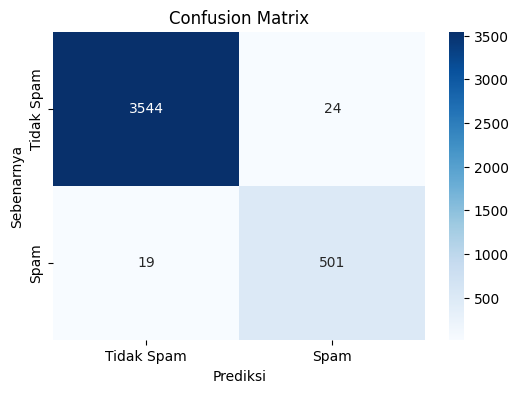

In [28]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# evaluasi data train resampled
accuracy = accuracy_score(df_train['Spam'], df_train['Predicted']) #mengubah dari train menjadi train_resampled
print("Akurasi Model:", accuracy)
print("Laporan Klasifikasi:\n", classification_report(df_train['Spam'], df_train['Predicted'])) #mengubah dari train menjadi train_resampled

# Confusion Matrix data train
cm = confusion_matrix(df_train['Spam'], df_train['Predicted']) #mengubah dari train menjadi train_resampled
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Tidak Spam', 'Spam'], yticklabels=['Tidak Spam', 'Spam'])
plt.xlabel('Prediksi')
plt.ylabel('Sebenarnya')
plt.title('Confusion Matrix')
plt.show()


In [29]:

testnih['Predicted'] = testnih['Message'].apply(predict_naive_bayes)
df_test = testnih[['Message', 'Spam', 'Predicted']]
df_test

C:\Users\ASUS\AppData\Local\Temp\ipykernel_8376\1706770627.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  testnih['Predicted'] = testnih['Message'].apply(predict_naive_bayes)


,Message,Spam,Predicted
4088,sorry ill call later ltgt min,0,0
4089,ok im waliking ard wan buy anything go house,0,0
4090,chance reality fantasy show call p per min ntt...,1,1
4091,heard call night knickers make beg like last t...,1,0
4092,ok happen behave like,0,0
...,...,...,...
5105,sorry uncle ill keep touch,0,0
5106,k pick another th youre done,0,0
5107,ee message na poortiyagi odalebeku hanumanji n...,0,0
5108,aight ive set free think could text blake addr...,0,0


Akurasi Model: 0.9902152641878669
Laporan Klasifikasi:
               precision    recall  f1-score   support

           0       0.99      1.00      0.99       903
           1       0.97      0.95      0.96       119

    accuracy                           0.99      1022
   macro avg       0.98      0.97      0.98      1022
weighted avg       0.99      0.99      0.99      1022



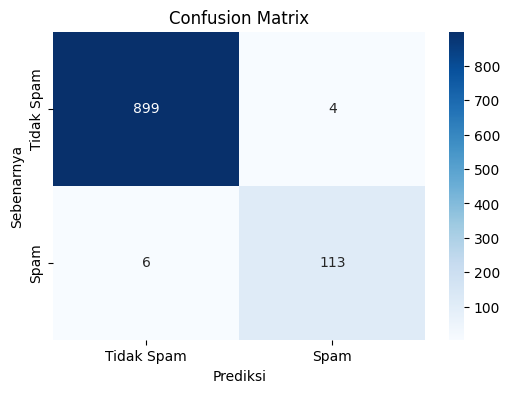

In [30]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix


accuracy = accuracy_score(df_test['Spam'], df_test['Predicted'])
print("Akurasi Model:", accuracy)
print("Laporan Klasifikasi:\n", classification_report(df_test['Spam'], df_test['Predicted']))

cm = confusion_matrix(df_test['Spam'],df_test['Predicted'])

# Menampilkan confusion matrix dengan seaborn heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Tidak Spam', 'Spam'], yticklabels=['Tidak Spam', 'Spam'])
plt.xlabel('Prediksi')
plt.ylabel('Sebenarnya')
plt.title('Confusion Matrix')
plt.show()


In [31]:
df_test['Predicted'].value_counts()

Predicted
0    905
1    117
Name: count, dtype: int64

# EDA Phising

In [32]:
import pandas as pd

kondisi = d2['Phishing'] != -1.0

d2 = d2[kondisi]

print("Jumlah baris di d2_bersih setelah menghapus -1:", len(d2))
print("Nilai yang unik pada kolom phishing :", d2['Phishing'].unique())
print(d2['Phishing'].value_counts())


Jumlah baris di d2_bersih setelah menghapus -1: 18088
Nilai yang unik pada kolom phishing : [0. 1.]
Phishing
0.0    11119
1.0     6969
Name: count, dtype: int64


In [33]:
import random
import random
d2= d2.sample(frac=1, random_state=42).reset_index(drop=True)

# Tentukan indeks untuk split
split_index = int(0.8 * len(d2))

# Split dataset menjadi train dan test
trainih= d2.iloc[:split_index]
testnih = d2.iloc[split_index:]
print("Jumlah data train:", len(trainih))
print("Jumlah data test:", len(testnih))


Jumlah data train: 14470
Jumlah data test: 3618


In [34]:
Phishing_messages = d2[d2['Phishing'] == 1]['Message']
Safe_messages = d2[d2['Phishing'] == 0]['Message']
print("Jumlah pesan Phishing:", len(Phishing_messages))
print("Jumlah pesan Safe:", len(Safe_messages))

Jumlah pesan Phishing: 6969
Jumlah pesan Safe: 11119


In [37]:
from collections import defaultdict
Safe_word_counts = defaultdict(int)
Phishing_word_counts = defaultdict(int)

total_Phishing_words = 0
total_Safe_words = 0

for message in Phishing_messages:
    for word in message.split():
        Phishing_word_counts[word] += 1
        total_Phishing_words += 1

for message in Safe_messages:
    for word in message.split():
        Safe_word_counts[word] += 1
        total_Safe_words += 1
print("Kata dalam Spam:", dict(Phishing_word_counts))
print("Kata dalam Ham:", dict(Safe_word_counts))
print("Total Kata Spam:", total_Phishing_words)
print("Total Kata Ham:", total_Safe_words)

Kata dalam Spam: {'extra': 274, 'time': 3607, 'last': 734, 'longer': 287, 'new': 3032, 'doctor': 268, 'developed': 142, 'herbal': 95, 'supplement': 61, 'allows': 157, 'user': 575, 'control': 484, 'ejaculation': 55, 'completely': 163, 'curing': 1, 'premature': 39, 'sexual': 324, 'dysfunction': 86, 'problem': 538, 'non': 165, 'hormonal': 9, 'therapy': 58, 'act': 1090, 'locally': 18, 'sex': 417, 'organ': 27, 'regulates': 12, 'process': 522, 'neuro': 11, 'endocrine': 11, 'pathway': 9, 'high': 920, 'centre': 56, 'emotion': 15, 'brain': 42, 'http': 3129, 'gluiest': 1, 'biz': 281, 'et': 166, 'cheap': 257, 'oem': 182, 'software': 2103, 'shipping': 598, 'worldwide': 387, 'writ': 4, 'baffle': 3, 'schematically': 1, 'intermingle': 1, 'bandage': 3, 'credulousness': 1, 'broadeners': 1, 'unfulfilled': 2, 'scorer': 1, 'nature': 135, 'cavalierly': 1, 'posh': 2, 'pleads': 1, 'perfectionist': 1, 'masterpiece': 5, 'exiting': 1, 'trio': 5, 'hearken': 4, 'searchings': 1, 'text': 403, 'mate': 27, 'reeducati

In [36]:
vocabulary = set(" ".join(d2['Message']).split())
vocab_size = len(vocabulary)


prior probability

In [38]:
p_phishing_train = len(Phishing_messages) / len(trainih)
p_safe_train= len(Safe_messages) / len(trainih) #prior probability
print("Prior Probability Phishing:", p_phishing_train)
print("Prior Probability Safe:", p_safe_train)

Prior Probability Phishing: 0.4816171389080857
Prior Probability Safe: 0.7684174153420871


In [39]:

def calculate_word_probabilities(word_counts, total_words, vocab_size):
    probabilities = {}
    for word in vocabulary:
        probabilities[word] = (word_counts[word] + 1) / (total_words + vocab_size)  # Laplace smoothing
    return probabilities
Phishing_word_probs = calculate_word_probabilities(Phishing_word_counts, total_Phishing_words, vocab_size) #conditional probability
Safe_word_probs= calculate_word_probabilities(Safe_word_counts, total_Safe_words, vocab_size)
print("Conditional Probability Phising:", Phishing_word_probs)
print("Conditional Probability Safe:", Safe_word_probs)


Conditional Probability Phising: {'elegantly': 8.530057791141535e-07, 'spamassassinskip': 8.530057791141535e-07, 'inconvenient': 8.530057791141535e-07, 'predominate': 5.118034674684921e-06, 'iwpt': 8.530057791141535e-07, 'sortlynx': 8.530057791141535e-07, 'nickle': 8.530057791141535e-07, 'bhonn': 8.530057791141535e-07, 'moranheather': 8.530057791141535e-07, 'symplectic': 3.412023116456614e-06, 'tecgtf': 1.706011558228307e-06, 'regulationsthe': 8.530057791141535e-07, 'complying': 3.412023116456614e-06, 'gccountry': 2.5590173373424606e-06, 'isbn': 2.5590173373424606e-06, 'similiarly': 8.530057791141535e-07, 'phara': 2.5590173373424606e-06, 'debtwe': 2.5590173373424606e-06, 'omb': 8.530057791141535e-07, 'cepe': 8.530057791141535e-07, 'smelter': 1.706011558228307e-06, 'tripwire': 8.530057791141535e-07, 'conroe': 8.530057791141535e-07, 'murielvasconcellos': 8.530057791141535e-07, 'gyzdre': 1.706011558228307e-06, 'encore': 3.412023116456614e-06, 'manpages': 8.530057791141535e-07, 'castells':

In [40]:
import numpy as np
def predict_naive_bayes(message):
    perkata = message.split()

    phishing_prob = np.log(p_spam_train)  #di log biarv mencegah underflow, dan prior probability yang sebelumnya, jadi harusnya p_spam_train
    safe_prob = np.log(p_ham_train)

    for kata in perkata:
        phishing_prob += np.log(Phishing_word_probs.get(kata, 1 / (total_Phishing_words + vocab_size))) #p (word |spam), jika tidak ada maka menggunakan laplace smoothing
        safe_prob += np.log(Safe_word_probs.get(kata, 1 / (total_Safe_words + vocab_size)))

        #Jika spam_prob1 lebih besar dari ham_prob1, maka email tersebut diprediksi sebagai spam (return 1).
        #Jika spam_prob1 lebih besar" artinya nilai akhir (setelah log probabilitas dari semua kata ditambahkan)
         #dari spam_prob1 lebih besar daripada nilai akhir dari ham_prob1.
        #Ini menunjukkan bahwa model kita lebih yakin bahwa email tersebut adalah spam.


    return 1 if phishing_prob > safe_prob else 0

trainih['Predicted'] = trainih['Message'].apply(predict_naive_bayes)
df_train2 = trainih[['Message', 'Phishing', 'Predicted']]
df_train2

C:\Users\ASUS\AppData\Local\Temp\ipykernel_8376\3503632453.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trainih['Predicted'] = trainih['Message'].apply(predict_naive_bayes)


,Message,Phishing,Predicted
0,metathesis content length please post followin...,0.0,0
1,recruiting good afternoon packing email style ...,0.0,0
2,extra time last time longer extra time last ti...,1.0,1
3,change scada server nahou scada name scada ser...,0.0,0
4,cheap oem software shipping worldwide writ baf...,1.0,1
...,...,...,...
14465,kevinin past administering large domain ive us...,0.0,0
14466,url httpjeremyzawodnycomblogarchiveshtml date ...,0.0,0
14467,wife video goodbye billion meccabask galt cove...,1.0,1
14468,power trading system bi weekly status week end...,0.0,0


Akurasi Model: 0.9856945404284727
Laporan Klasifikasi:
               precision    recall  f1-score   support

         0.0       0.98      0.99      0.99      8843
         1.0       0.99      0.98      0.98      5627

    accuracy                           0.99     14470
   macro avg       0.99      0.98      0.98     14470
weighted avg       0.99      0.99      0.99     14470



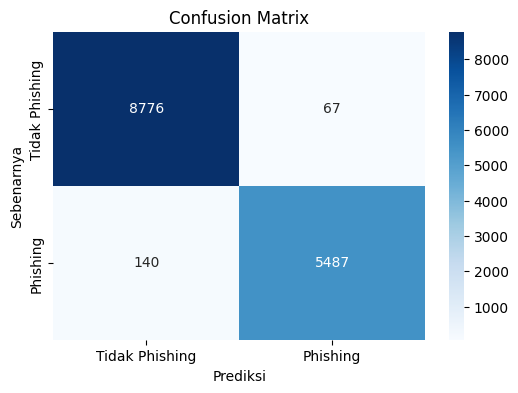

In [41]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# evaluasi data train resampled
accuracy = accuracy_score(df_train2['Phishing'], df_train2['Predicted']) #mengubah dari train menjadi train_resampled
print("Akurasi Model:", accuracy)
print("Laporan Klasifikasi:\n", classification_report(df_train2['Phishing'], df_train2['Predicted'])) #mengubah dari train menjadi train_resampled

# Confusion Matrix data train
cm = confusion_matrix(df_train2['Phishing'], df_train2['Predicted']) #mengubah dari train menjadi train_resampled
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Tidak Phishing', 'Phishing'], yticklabels=['Tidak Phishing', 'Phishing'])
plt.xlabel('Prediksi')
plt.ylabel('Sebenarnya')
plt.title('Confusion Matrix')
plt.show()


In [42]:

testnih['Predicted'] = testnih['Message'].apply(predict_naive_bayes)
df_test2 = testnih[['Message', 'Phishing', 'Predicted']]
df_test2

C:\Users\ASUS\AppData\Local\Temp\ipykernel_8376\830125660.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  testnih['Predicted'] = testnih['Message'].apply(predict_naive_bayes)


,Message,Phishing,Predicted
14470,fri jul bst michl alexandre salim wrote angle ...,0.0,0
14471,serious professional dow jones nasdaq remains ...,1.0,1
14472,congratulation free lotto company uk head offi...,1.0,1
14473,eol average deal count wanted make sure sheri ...,0.0,0
14474,giga ph armacy trsut welcome health suite chek...,1.0,1
...,...,...,...
18083,next kin needed dear sir name mr obi w manager...,1.0,1
18084,tue patton tony wrote someone translate lost s...,0.0,0
18085,enymex brad may consider targeting wide audien...,0.0,0
18086,wip report attached updated wip report week th...,0.0,0


Akurasi Model: 0.9867330016583747
Laporan Klasifikasi:
               precision    recall  f1-score   support

         0.0       0.99      0.99      0.99      2276
         1.0       0.99      0.98      0.98      1342

    accuracy                           0.99      3618
   macro avg       0.99      0.99      0.99      3618
weighted avg       0.99      0.99      0.99      3618



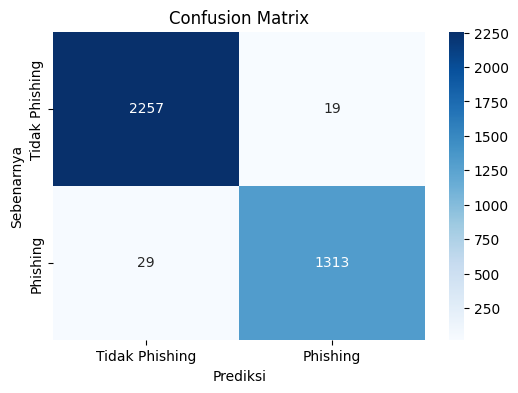

In [43]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix


accuracy = accuracy_score(df_test2['Phishing'], df_test2['Predicted'])
print("Akurasi Model:", accuracy)
print("Laporan Klasifikasi:\n", classification_report(df_test2['Phishing'], df_test2['Predicted']))

cm = confusion_matrix(df_test2['Phishing'],df_test2['Predicted'])

# Menampilkan confusion matrix dengan seaborn heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Tidak Phishing', 'Phishing'], yticklabels=['Tidak Phishing', 'Phishing'])
plt.xlabel('Prediksi')
plt.ylabel('Sebenarnya')
plt.title('Confusion Matrix')
plt.show()
